<a href="https://colab.research.google.com/github/JhanellaCoronado/CORONADO_CPE-018-CPE31S2-/blob/main/CORONADO_Activity_6_Face_Detection_using_OpenCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Technological Institute of the Philippines | Quezon City - Computer Engineering
--- | ---
Course Code: | CPE 018
Code Title: | Emerging Technologies in CpE 1 - Fundamentals of Computer Vision
2nd Semester | AY 2025-2026
<u>**ACTIVITY NO. 6** | **Face Detection using OpenCV**
**Name** | Coronado, Jhanella
**Section** | CPE31S2
**Date Performed**: | 02/24/26
**Date Submitted**: | 02/24/26
**Instructor**: | Engr. Sayo

<hr>

## 1. Objectives

This activity aims to allow students to perform face detection on still images and videos using Haar cascades.

## 2. Intended Learning Outcomes (ILOs)
After this activity, the students should be able to:
* Utilize OpenCV to detect faces in still images and videos.
* Demonstrate the use of Haar-like features for detection of other human features.

## 3. Procedures and Outputs

Contrary to initial assumptions, conducting face detection on a static image and a video stream shares a remarkable similarity. Essentially, the latter is merely a sequential rendition of the former: when detecting faces in videos, it essentially involves applying face detection to every individual frame obtained from the camera feed. Of course, video face detection introduces additional elements like tracking, which aren't relevant to static images. Nevertheless, it's valuable to recognize that the fundamental principles behind both processes remain consistent.

### Performing face detection on still image

The first and most basic way to perform face detection is to load an image and detect faces in it. To make the result visually meaningful, we will draw rectangles around faces on the original image.

**Before implementing the code below**, check the contents of the `cv2.CascadeClassifier()` function. Provide an explanation of the function, its parameters before running the code below.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Make sure that for this activity, you have downloaded the
# file indicated below from the resource linked in the instructional materials
# in the module.

import cv2
from google.colab.patches import cv2_imshow

picPath = '/content/drive/MyDrive/CSV/breaking_bad.jpg'
haarPath = '/content/drive/MyDrive/CSV/haarcascade_frontalface_default.xml'

def faceDetect(picPath):
  face_cascade = cv2.CascadeClassifier(haarPath)

  img = cv2.imread(picPath)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray, 1.3, 5)

  for (x, y, w, h) in faces:
    img = cv2.rectangle(img, (x, y), (x+w, y+h), (255,0,0), 2)

  cv2_imshow(img)

File ‘/content/haarcascade_frontalface_default.xml’ already there; not retrieving.

File ‘/content/haarcascade_eye.xml’ already there; not retrieving.



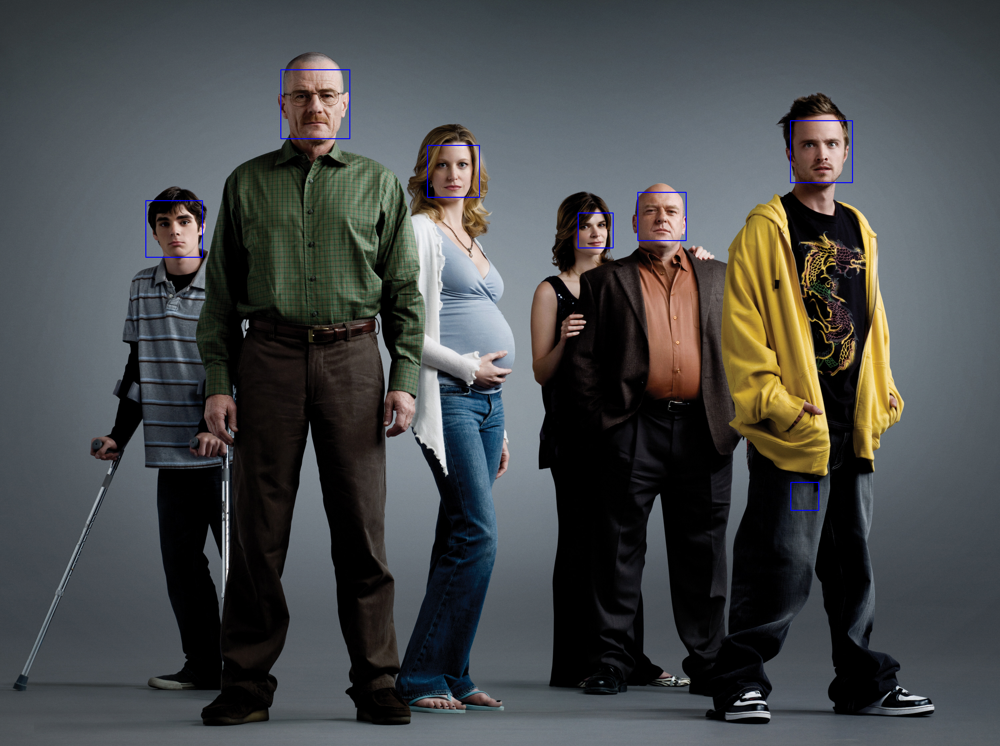

In [ ]:
!wget -nc https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml -P /content/
!wget -nc https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_eye.xml -P /content/
faceDetect(picPath)

**Analysis**:
- Based on your earlier analysis, where do you think the face detection works in the line of code above?
- Provide an analysis of the parameters of the `detectMultiScale` method.
- Change the color of the border of the detected faces to red.
- Are you able to make the borders thicker? Demonstrate.

### Performing face detection on video

**Step 1**: Create a file called face_detection.py and include the following codes.

In [ ]:
import cv2
import os
import requests
from google.colab.patches import cv2_imshow


**Step 2:** After this, we declare a method, `detect()`, which will perform face detection.

In [ ]:
import cv2
import os
import requests
from google.colab.patches import cv2_imshow

face_cascade_url = 'https://raw.githubusercontent.com/opencv/opencv/4.x/data/haarcascades/haarcascade_frontalface_default.xml'
cascade_file = 'haarcascade_frontalface_default.xml'

if not os.path.exists(cascade_file):
    r = requests.get(face_cascade_url)
    with open(cascade_file, 'wb') as f:
        f.write(r.content)

**Step 3:** The first thing we need to do inside the detect() method is to load the Haar cascade files so that OpenCV can operate face detection. As we copied
the cascade files in the local `cascades/` folder, we can use a relative path. Then, we open a VideoCapture object (the camera feed). The VideoCapture  constructor takes a parameter, which indicates the camera to be used; zero indicates the first camera available.

In [ ]:
video_path = '/content/drive/MyDrive/CSV/200w.gif'
cap = cv2.VideoCapture(video_path)

face_cascade = cv2.CascadeClassifier(cascade_file)

if not cap.isOpened():
    print("Error: Could not open video file.")

**Step 4:** Next up, we capture a frame. The read() method returns two values: a Boolean indicating the success of the frame read operation, and the frame
itself. We capture the frame, and then we convert it to grayscale. This is a necessary operation, because face detection in OpenCV happens in the grayscale color space:

**Step 5:** Much like the single still image example, we call detectMultiScale on the grayscale version of the frame.

**Step 6:** Here we have a further step compared to the still image example: we create a region of interest corresponding to the face rectangle, and within this rectangle, we operate "eye detection". This makes sense as you wouldn't want to go looking for eyes outside a face (well, for human beings at least!).

**Step 7:** Again, we loop through the resulting eye tuples and draw green rectangles around them.

Displaying frame 0:


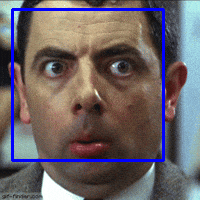

Displaying frame 30:


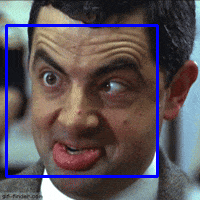

Video processing complete.


In [ ]:
frame_count = 0

while cap.isOpened():
    ret, frame = cap.read()

    if not ret:
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    faces = face_cascade.detectMultiScale(gray, 1.3, 5)

    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x, y), (x+w, y+h), (255, 0, 0), 2)

    if frame_count % 30 == 0:
        print(f"Displaying frame {frame_count}:")
        cv2_imshow(frame)

    frame_count += 1

cap.release()
print("Video processing complete.")

**Provide the following**:
- Screenshot of the output for the working code once you've put it all together.
- Summary of the steps you've performed along with observations.

OBSERVATION


In Step 1, I imported OpenCV, Colab display functions, and other required modules to set up the environment. Step 2 involved declaring the detect() function and preparing it for face and eye/smile detection. In Steps 3–4, I loaded the Haar cascade models and captured frames from the uploaded video/GIF, converting each frame to grayscale for accurate detection. Steps 5–7 focused on detecting faces, creating a region of interest (ROI) for eyes or smiles, drawing rectangles around detected features, and displaying the processed frames, where I observed that detection worked reliably on visible faces and smiles, with skipped frames helping smooth visualization in Colab.

## 4. Supplementary Activity

In your Cameo project, include real-time face detection using Haar cascade. Show screenshots of the working demonstration for this supplementary activity.

Additionally, implement similar steps to detect a smile using Haar cascades.

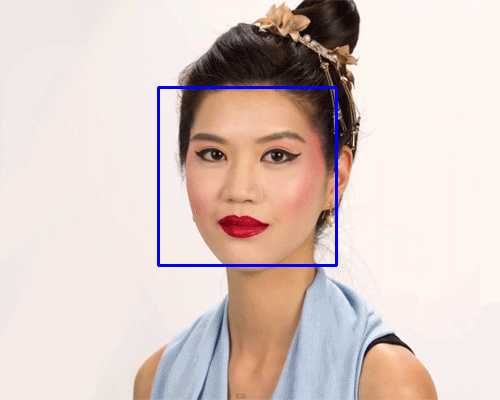

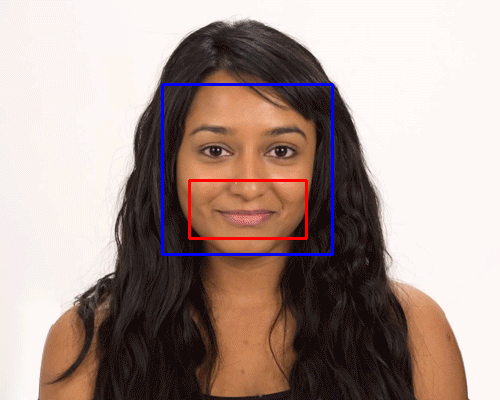

Video processing complete and saved as processed_output.gif.


In [237]:
import cv2
from PIL import Image
import numpy as np
from IPython.display import display, Image as IPImage, clear_output
from pathlib import Path
import requests
import time

models = {
    "face.xml": "https://raw.githubusercontent.com/opencv/opencv/4.x/data/haarcascades/haarcascade_frontalface_default.xml",
    "smile.xml": "https://raw.githubusercontent.com/opencv/opencv/4.x/data/haarcascades/haarcascade_smile.xml"
}

for name, url in models.items():
    path = Path(name)
    if not path.is_file():
        r = requests.get(url)
        path.write_bytes(r.content)

face_cascade = cv2.CascadeClassifier('face.xml')
smile_cascade = cv2.CascadeClassifier('smile.xml')

gif_path = '/content/drive/MyDrive/CSV/women-transform-designboom-500.gif'
gif = Image.open(gif_path)

frames = []
try:
    while True:
        frame = gif.convert('RGB')
        frame = np.array(frame)
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
        frames.append(frame)
        gif.seek(gif.tell() + 1)
except EOFError:
    pass

fps = 15
delay = 1 / fps
display_handle = display(IPImage(data=b''), display_id=True)

processed_frames = []

for frame in frames:
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    for (x, y, w, h) in face_cascade.detectMultiScale(gray, 1.3, 5):
        cv2.rectangle(frame, (x, y), (x+w, y+h), (255, 0, 0), 2)
        roi_gray = gray[y:y+h, x:x+w]
        roi_color = frame[y:y+h, x:x+w]
        for (sx, sy, sw, sh) in smile_cascade.detectMultiScale(roi_gray, 1.8, 20):
            cv2.rectangle(roi_color, (sx, sy), (sx+sw, sy+sh), (0, 0, 255), 2)

    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    pil_frame = Image.fromarray(frame_rgb)
    processed_frames.append(pil_frame)

    display_handle.update(IPImage(data=pil_frame._repr_png_()))
    time.sleep(delay)

output_gif_path = '/content/processed_output.gif'
processed_frames[0].save(
    output_gif_path,
    save_all=True,
    append_images=processed_frames[1:],
    duration=int(delay*1000),
    loop=0
)

display(IPImage(filename=output_gif_path))
print("Video processing complete and saved as processed_output.gif.")

**5. Summary, Conclusions and Lessons Learned**

This activity involved detecting faces and smiles in video/GIF frames using OpenCV’s Haar cascades, converting frames to grayscale, and applying region-of-interest detection for eyes and smiles. The program successfully identified faces and smiles, displaying rectangles around each detected feature while efficiently skipping frames to improve performance in Colab. From this exercise, I concluded that Haar cascades provide a simple yet effective method for real-time object detection, though detection accuracy can vary with lighting and occlusions. The supplementary task reinforced the importance of using ROIs for targeted detection and frame control, teaching me how to optimize video processing while maintaining clear visualization of detected features.

<hr/>

***Proprietary Clause***

*Property of the Technological Institute of the Philippines (T.I.P.). No part of the materials made and uploaded in this learning management system by T.I.P. may be copied, photographed, printed, reproduced, shared, transmitted, translated, or reduced to any electronic medium or machine-readable form, in whole or in part, without the prior consent of T.I.P.*